# Installing the package

Uncomment this line to download the package. For best results, install PyVaR in a fresh Python environment to avoid conflicts with existing packages.

In [1]:
#pip install git+https://github.com/Alessandro-Dodon/pyvar.git#subdirectory=package

---

## Notebook Overview

This notebook is dedicated to **simulation-based methods** for portfolio risk analysis. Instead of relying on closed-form analytic formulas, we estimate risk through scenarios generated from historical or simulated distributions.

We focus on the most widely used simulation techniques for both **equity and option portfolios**, leveraging the **Black-Scholes framework** for pricing.
The methods covered include:

- **Monte Carlo (MC) simulation** based on normal innovations
- A more flexible **GMM-based simulation** 
- **Historical Simulation (HS)** based on actual past returns
- **Weighted Historical Simulation (WHS)** for time-decaying shocks
- **Filtered Historical Simulation (FHS)** combining volatility modeling with empirical return sampling

These techniques allow us to capture non-linear instruments, making simulation a powerful tool for realistic portfolio VaR and Expected Shortfall estimation.


### Packages

We begin by importing the `pyvar` package along with other necessary libraries for data handling, analysis, and visualization. Ensure all required packages are installed in your environment before proceeding.

In [2]:
import pyvar as pv

In [3]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from sklearn.mixture import GaussianMixture
import seaborn as sns
from matplotlib.ticker import FuncFormatter

---

### Creating a Portfolio 

Our package provides simple functions to automatically build your portfolio: prices are downloaded from Yahoo Finance, you specify the number of shares, and optionally convert everything to your base currency (USD in our case). Those are particularly useful to check common problems like missing values, stability of the VCV matrix etc.

Our example portfolio follows a stylized global equity strategy:  
- Long positions in broad market, regional, and sector ETFs (VT, SPY, VGK, EWJ, VWO)  
- Exposure to leading firms in tech, healthcare, and consumer sectors (AAPL, JNJ, PG, UNH, NVS)  
- A small short position in industrials (XLI) to hedge against cyclical downturns

We assume a **buy-and-hold** or "lazy portfolio" strategy. No active trading or rebalancing is considered. If the portfolio composition changes, all subsequent VaR and ES metrics must be recomputed from that point onward.

In [4]:
# Define shares — globally diversified portfolio
shares = pd.Series({
    "VT": 120,     # Global equity ETF
    "SPY": 80,     # US large-cap ETF
    "VGK": 60,     # Europe ETF
    "EWJ": 40,     # Japan ETF
    "VWO": 60,     # Emerging Markets ETF
    "AAPL": 50,    # Apple — tech
    "JNJ": 50,     # Johnson & Johnson — healthcare
    "PG": 40,      # Procter & Gamble — consumer staples
    "UNH": 40,     # UnitedHealth — healthcare
    "NVS": 30,     # Novartis — Swiss healthcare
    "XLI": -30     # US industrials sector ETF — short hedge
})

# Download prices and convert to base currency
tickers = shares.index.tolist()
raw_prices = pv.get_raw_prices(tickers, start="2023-01-01", end="2025-01-01")
prices_usd = pv.convert_to_base_currency(raw_prices, base_currency="USD")

# Compute monetary position values over time
portfolio_matrix = pv.create_portfolio(prices_usd, shares)

# Compute portfolio returns and statistics
portfolio_returns = pv.compute_returns(portfolio_matrix)

[currency detection] AAPL: USD
[currency detection] EWJ: USD
[currency detection] JNJ: USD
[currency detection] NVS: USD
[currency detection] PG: USD
[currency detection] SPY: USD
[currency detection] UNH: USD
[currency detection] VGK: USD
[currency detection] VT: USD
[currency detection] VWO: USD
[currency detection] XLI: USD


In [5]:
prices_usd.tail()

,AAPL,EWJ,JNJ,NVS,PG,SPY,UNH,VGK,VT,VWO,XLI
Date,,,,,,,,,,,
2024-12-24,257.286682,65.916412,142.416565,94.822296,165.742447,597.729492,500.394104,62.738388,118.741814,44.595383,133.343307
2024-12-26,258.103729,66.680229,142.152908,94.870506,166.939377,597.769348,505.387146,62.905247,118.880699,44.485809,133.442688
2024-12-27,254.685883,67.186142,141.635391,94.860863,166.321289,591.476868,504.240234,62.699131,117.948227,44.326435,132.448776
2024-12-30,251.307877,66.620720,139.965652,93.838882,163.927460,584.727173,502.074921,62.286896,116.807434,43.937958,131.116943
2024-12-31,249.534180,66.561195,141.215500,93.819595,164.476868,582.599915,500.156769,62.296711,116.539597,43.868229,130.957916


In [6]:
# Compute latest portfolio value and weights
latest_prices = prices_usd.iloc[-1]
portfolio_value_usd = (shares * latest_prices).sum()
weights = (shares * latest_prices) / portfolio_value_usd

# Print final portfolio value and weights
print(f"\nFinal portfolio value in USD: {portfolio_value_usd:,.2f}\n")
print("Portfolio weights (based on latest prices):")
print(weights.round(4).sort_values(ascending=False))


Final portfolio value in USD: 114,633.77

Portfolio weights (based on latest prices):
SPY     0.4066
UNH     0.1745
VT      0.1220
AAPL    0.1088
JNJ     0.0616
PG      0.0574
VGK     0.0326
NVS     0.0246
EWJ     0.0232
VWO     0.0230
XLI    -0.0343
dtype: float64


A quick way to observe the correlations of our portfolio!


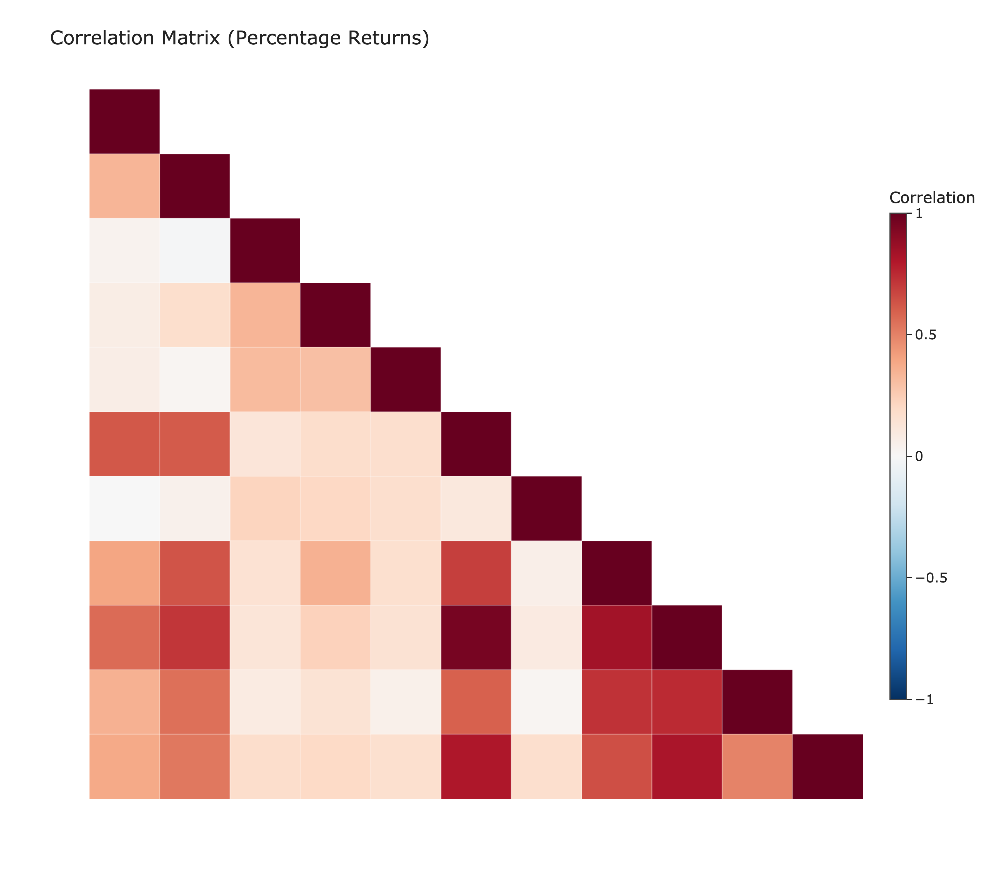

In [7]:
pv.plot_correlation_matrix(portfolio_matrix, interactive=False)

In [8]:
portfolio_matrix.tail()

,AAPL,EWJ,JNJ,NVS,PG,SPY,UNH,VGK,VT,VWO,XLI
Date,,,,,,,,,,,
2024-12-24,12864.334106,2636.656494,7120.828247,2844.668884,6629.697876,47818.359375,20015.764160,3764.303284,14249.017639,2675.722961,-4000.299225
2024-12-26,12905.186462,2667.209167,7107.645416,2846.115189,6677.575073,47821.547852,20215.485840,3774.314804,14265.683899,2669.148560,-4003.280640
2024-12-27,12734.294128,2687.445679,7081.769562,2845.825882,6652.851562,47318.149414,20169.609375,3761.947861,14153.787231,2659.586105,-3973.463287
2024-12-30,12565.393829,2664.828796,6998.282623,2815.166473,6557.098389,46778.173828,20082.996826,3737.213745,14016.892090,2636.277466,-3933.508301
2024-12-31,12476.708984,2662.447815,7060.774994,2814.587860,6579.074707,46607.993164,20006.270752,3737.802658,13984.751587,2632.093735,-3928.737488


In [9]:
portfolio_returns.tail()

,AAPL,EWJ,JNJ,NVS,PG,SPY,UNH,VGK,VT,VWO,XLI
Date,,,,,,,,,,,
2024-12-24,0.011478,-0.000602,0.003993,-0.001016,0.004937,0.011115,-0.000474,0.005506,0.007915,0.004037,0.007812
2024-12-26,0.003176,0.011588,-0.001851,0.000508,0.007222,0.000067,0.009978,0.002660,0.001170,-0.002457,0.000745
2024-12-27,-0.013242,0.007587,-0.003641,-0.000102,-0.003702,-0.010527,-0.002269,-0.003277,-0.007844,-0.003583,-0.007448
2024-12-30,-0.013263,-0.008416,-0.011789,-0.010773,-0.014393,-0.011412,-0.004294,-0.006575,-0.009672,-0.008764,-0.010055
2024-12-31,-0.007058,-0.000893,0.008930,-0.000206,0.003352,-0.003638,-0.003820,0.000158,-0.002293,-0.001587,-0.001213


If you want to **save the DataFrame shown above**, use:

```python
portfolio_returns.to_csv("portfolio_returns.csv")
```

If you want to **import your own CSV**, make sure the first column contains dates and use:

```python
df = pd.read_csv("your_file.csv", index_col=0, parse_dates=True)
```

This ensures:
- The first column becomes the date index
- Dates are properly parsed for the analysis

Note: You are responsible for data cleaning and pre-processing when using your own files. Our data-download functions will print warnings if there are issues, but they do not perform automatic cleaning.

---

### One-Day Ahead Monte Carlo Simulation

We implement a one-day Monte Carlo simulation to estimate **Value-at-Risk** (VaR) and **Expected Shortfall** (ES) under the assumption of **multivariate normal returns**. Parameters $(\mu, \Sigma)$ are estimated directly from empirical **log-returns**.

The simulation proceeds as follows:

1. Estimate parameters:
$$
\mu = \mathbb{E}[r_t], \qquad \Sigma = \operatorname{Cov}(r_t), \qquad L = \operatorname{Cholesky}(\Sigma).
$$

2. Generate $N$ scenarios of log-returns:
$$
r^{(i)} = \mu + L z^{(i)}, \qquad z^{(i)} \sim \mathcal{N}(0, I).
$$

3. Propagate simulated returns to prices:
$$
S^{(i)} = S_0 \circ \exp(r^{(i)}),
$$
where $\circ$ denotes element-wise multiplication.  

4. Compute portfolio profit and loss:
$$
\Delta P^{(i)} = w^\top(S^{(i)} - S_0) 
+ \sum_{j=1}^{N_{\mathrm{opt}}} q_j \Big(C(S_j^{(i)}, K_j, \tau_j', r, \sigma_j) - C_{j,0}\Big),
$$
where $q_j$ is the number of option contracts, $C(\cdot)$ is the Black--Scholes price, and 
$\tau_j' = \max(T_j - \tfrac{1}{252}, 0)$ is the adjusted time to maturity.  

5. Define losses:
$$
\ell^{(i)} = -\Delta P^{(i)}.
$$

6. Compute risk measures from the simulated empirical distribution $\{\ell^{(i)}\}_{i=1}^N$:
$$
\text{VaR}_\alpha = Q_\alpha(\ell), \qquad
\text{ES}_\alpha = \mathbb{E}[\ell \mid \ell \geq \text{VaR}_\alpha].
$$

This approach captures both the **joint distribution** of asset returns and the non-linear risk of derivatives. It assumes **constant volatility and rates**, and is naturally limited to one-day ahead unless explicitly extended.


In [10]:
# Use existing spot prices and volatilities
S0 = prices_usd.iloc[-1]
volatility_annualized = portfolio_returns.std() * np.sqrt(252)

# Select representative tickers for options
selected_tickers = ["VT", "SPY", "AAPL", "JNJ", "XLI"]

# Create example option contracts
options = [
    {
        "asset_index": tickers.index("AAPL"),
        "K": 200,
        "T": 60 / 252,
        "r": 0.01,
        "sigma": volatility_annualized["AAPL"],
        "type": "call",
        "quantity": 3000,         # number of contracts
        "contract_size": 100         # unit size per contract
    },
    {
        "asset_index": tickers.index("XLI"),
        "K": 115,
        "T": 45 / 252,
        "r": 0.01,
        "sigma": volatility_annualized["XLI"],
        "type": "put",
        "quantity": 5000,
        "contract_size": 100
    },
    {
        "asset_index": tickers.index("VT"),
        "K": 100,
        "T": 90 / 252,
        "r": 0.01,
        "sigma": volatility_annualized["VT"],
        "type": "call",
        "quantity": 2500,
        "contract_size": 100
    }
]

In [11]:
# Print values of equity positions (already defined)
print("\nEquity Positions (latest prices):")
total_equity_value = 0
for tkr in tickers:
    position_value = shares[tkr] * S0[tkr]
    print(f"{tkr:5}: {shares[tkr]:4} × {S0[tkr]:.2f} = {position_value:,.2f} USD")
    total_equity_value += position_value

# Price and print values of options
print("\nOption Values (Black-Scholes at time 0):")
total_option_value = 0
for i, opt in enumerate(options):
    spot = S0[tickers[opt["asset_index"]]]
    price_bs = pv.black_scholes_pricing(
        spot, opt["K"], opt["T"], opt["r"], opt["sigma"], opt["type"]
    )
    option_value = price_bs * opt["quantity"] * opt["contract_size"]
    print(f"Option {i+1} on {tickers[opt['asset_index']]} ({opt['type']}): "
          f"BS = {price_bs:.2f} × {opt['quantity']} × {opt['contract_size']} = {option_value:,.2f} USD")
    total_option_value += option_value

# Print new portfolio value
total_portfolio_value = total_equity_value + total_option_value
print(f"\nTotal equity value:     {total_equity_value:,.2f} USD")
print(f"Total option value:     {total_option_value:,.2f} USD")
print(f"Total portfolio value:  {total_portfolio_value:,.2f} USD")


Equity Positions (latest prices):
VT   :  120 × 116.54 = 13,984.75 USD
SPY  :   80 × 582.60 = 46,607.99 USD
VGK  :   60 × 62.30 = 3,737.80 USD
EWJ  :   40 × 66.56 = 2,662.45 USD
VWO  :   60 × 43.87 = 2,632.09 USD
AAPL :   50 × 249.53 = 12,476.71 USD
JNJ  :   50 × 141.22 = 7,060.77 USD
PG   :   40 × 164.48 = 6,579.07 USD
UNH  :   40 × 500.16 = 20,006.27 USD
NVS  :   30 × 93.82 = 2,814.59 USD
XLI  :  -30 × 130.96 = -3,928.74 USD

Option Values (Black-Scholes at time 0):
Option 1 on AAPL (call): BS = 50.14 × 3000 × 100 = 15,042,544.75 USD
Option 2 on XLI (put): BS = 0.04 × 5000 × 100 = 18,396.70 USD
Option 3 on VT (call): BS = 16.94 × 2500 × 100 = 4,235,811.88 USD

Total equity value:     114,633.77 USD
Total option value:     19,296,753.33 USD
Total portfolio value:  19,411,387.10 USD


#### General Simulations Parameters

In [12]:
# General parameters
confidence_level = 0.99
simulations = 10_000
seed = 1

In [13]:
# Run Parametric Monte Carlo VaR and ES 
var_mc, pnl_mc = pv.monte_carlo_simulation_var(
    price_data=prices_usd,  
    shares=shares,
    options=options,
    confidence_level=confidence_level,
    simulations=simulations, 
    seed=seed)

# Calculate ES
es_mc = pv.simulation_es(var_mc, pnl_mc)

# Display Monte Carlo Results
print(f"Monte Carlo VaR ({int(confidence_level * 100)}%):  {var_mc:,.2f} USD")
print(f"Monte Carlo ES ({int(confidence_level * 100)}%):  {es_mc:,.2f} USD")

Monte Carlo VaR (99%):  4,407,931.13 USD
Monte Carlo ES (99%):  5,151,462.32 USD



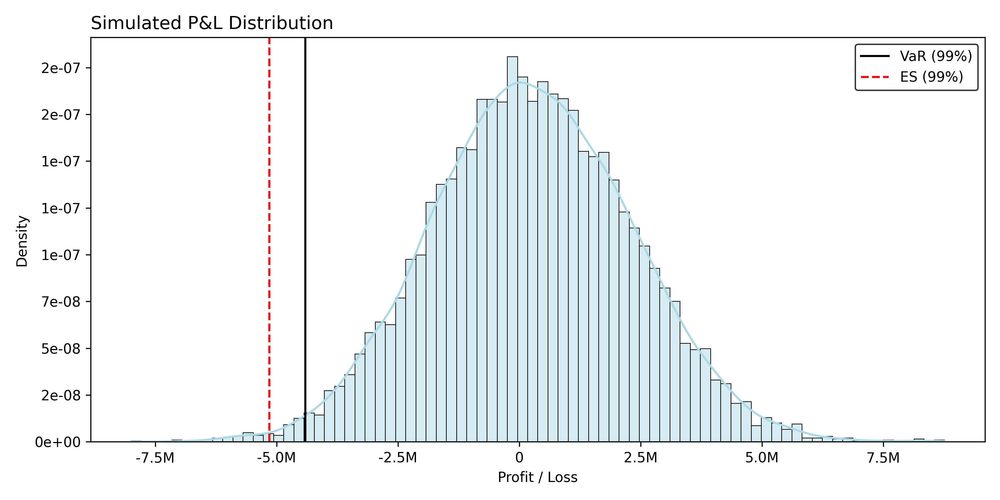

In [14]:
# Plot distribution
pv.plot_simulated_distribution(
    profit_and_loss=pnl_mc,
    var=var_mc,
    es=es_mc,
    confidence_level=confidence_level
)

---

### One-Day Ahead Monte Carlo with Gaussian Mixture Model (GMM)

This simulation method extends the normal Monte Carlo approach by assuming that asset log-returns follow a **Gaussian Mixture Model (GMM)** instead of a single multivariate normal distribution.

The GMM allows for **fat tails**, **asymmetry**, and **regime-switching behavior** by mixing multiple normal distributions:

$$
r^{(i)} \sim \sum_{k=1}^{K} \pi_k \cdot \mathcal{N}(\mu_k, \Sigma_k),
$$

Where:
- $k$ is the number of components (e.g. 2 or 3),
- $\pi_k$ are the mixture weights,
- $\mu_k$, $\Sigma_k$ are the mean and covariance of each component.

**Simulation Steps:**

1. Estimate GMM parameters from historical **log-returns**.
2. For each of the $N$ scenarios:
   - Randomly choose component $k$ with probability $\pi_k$.
   - Sample a return vector.
3. Convert to prices.
4. Recompute portfolio P&L for each scenario (stocks + options).
5. Compute VaR and ES as in standard Monte Carlo.

GMM simulations provide more realistic tail behavior than standard normal simulations, while still being tractable. They are especially useful when historical returns exhibit **non-Gaussian features**.


In [15]:
# GMM components
n_components = 3 # Can try other values

In [16]:
# Run GMM-based Monte Carlo VaR and ES
var_gmm, pnl_gmm = pv.gmm_monte_carlo_simulation_var(
    price_data=prices_usd,     
    shares=shares,
    options=options,
    confidence_level=confidence_level,
    simulations=simulations,
    seed=seed,
    n_components=n_components
)

# Calculate ES
es_gmm = pv.simulation_es(var_gmm, pnl_gmm)

# Display GMM Monte Carlo Results
print(f"GMM Monte Carlo VaR ({int(confidence_level * 100)}%):  {var_gmm:,.2f} USD")
print(f"GMM Monte Carlo ES ({int(confidence_level * 100)}%):  {es_gmm:,.2f} USD")

GMM Monte Carlo VaR (99%):  4,618,421.87 USD
GMM Monte Carlo ES (99%):  5,375,586.50 USD



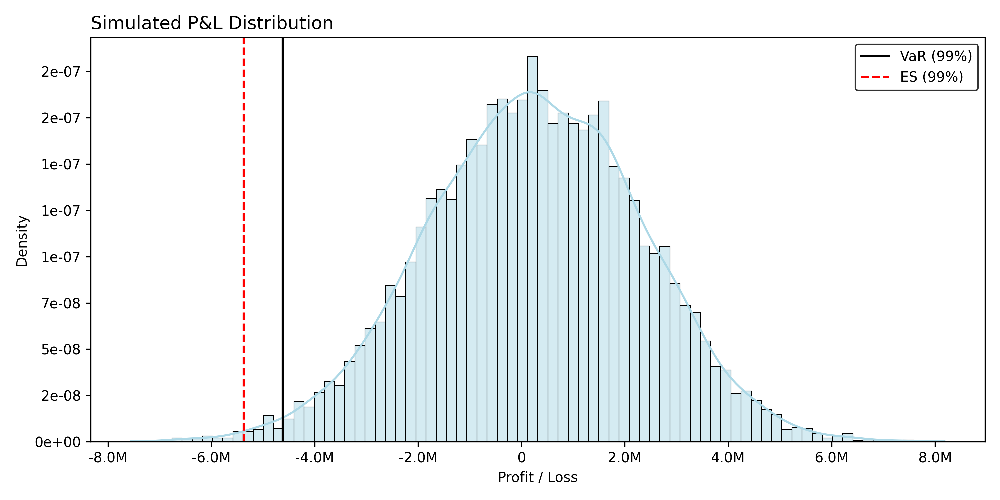

In [17]:
# Plot distribution
pv.plot_simulated_distribution(
    profit_and_loss=pnl_gmm,
    var=var_gmm,
    es=es_gmm,
    confidence_level=confidence_level
)

We inspect the fitted GMM components to see how different return regimes are captured through their weights, means, and volatilities.

In [18]:
# Fit GMM to portfolio returns
n_components = n_components  # Same as used in the simulation
gmm_model = GaussianMixture(n_components=n_components, random_state=seed)
gmm_model.fit(portfolio_returns.values.reshape(-1, 1))

# Extract and print GMM parameters
print("\nFitted GMM Parameters:")
for i in range(n_components):
    weight = gmm_model.weights_[i]
    mean = gmm_model.means_[i, 0]
    std = np.sqrt(gmm_model.covariances_[i, 0, 0])
    print(f"Component {i+1}: weight = {weight:.4f}, mean = {mean:.5f}, std = {std:.5f}")


Fitted GMM Parameters:
Component 1: weight = 0.6447, mean = 0.00088, std = 0.00691
Component 2: weight = 0.1580, mean = -0.00658, std = 0.01372
Component 3: weight = 0.1972, mean = 0.00507, std = 0.01384


---

### One-Day Ahead Bootstrapped Historical Simulation

The **bootstrapped historical simulation** is a variation of the standard historical approach where past return shocks are **randomly resampled with replacement**.

Instead of using all historical returns in order, we generate synthetic scenarios by drawing (with replacement) from the past.

This allows for:
- More flexible scenario generation,
- Estimating risk with fewer data points,

The portfolio is revalued for each synthetic return, and the VaR is computed from the resulting P&L distribution.


In [19]:
# Bootstrapped Historical Simulation (1-day, 99%)
var_historical_bootstrap, pnl_historical_bootstrap = pv.historical_simulation_var(
    price_data=prices_usd,
    shares=shares.values,
    options=options,
    confidence_level=confidence_level,
    bootstrap=True,
    simulations=simulations,
    seed=seed
)

# ES
es_historical_bootstrap = pv.simulation_es(var_historical_bootstrap, pnl_historical_bootstrap)

# Print results
print(f"Bootstrapped Historical VaR (99%):   {var_historical_bootstrap:,.2f} USD")
print(f"Bootstrapped Historical ES  (99%):   {es_historical_bootstrap:,.2f} USD")


Bootstrapped Historical VaR (99%):   4,556,184.04 USD
Bootstrapped Historical ES  (99%):   5,831,480.77 USD



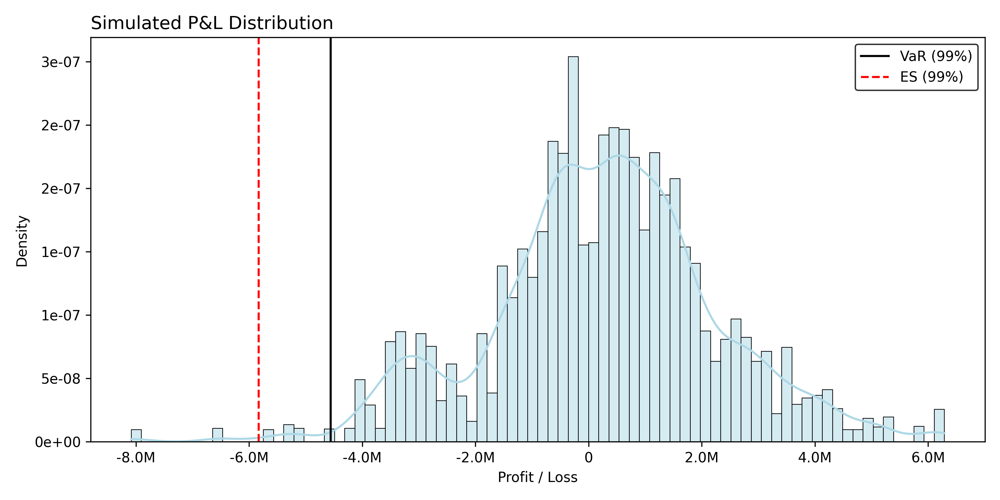

In [20]:
# Plot bootstrapped HS distribution
pv.plot_simulated_distribution(
    profit_and_loss=pnl_historical_bootstrap,
    var=var_historical_bootstrap,
    es=es_historical_bootstrap,
    confidence_level=confidence_level
)

---

### One-Day Ahead Weighted Historical Simulation (WHS)

The Weighted Historical Simulation (WHS) method modifies standard historical simulation by giving **more weight to recent observations**, using an **exponential decay scheme**:

$$
w_t = \alpha_0 \cdot \lambda^t, \quad \text{where } \alpha_0 = \frac{1 - \lambda}{\lambda(1 - \lambda^n)}
$$

for $t = 0, 1, \dots, n - 1$, and $\lambda \in (0,1)$ is a decay factor. These weights sum to 1 and are highest for the most recent observations ($t = 0$).

VaR is computed as the **weighted quantile**, and ES is adjusted accordingly:

$$
\text{VaR}_\alpha = Q_\alpha^{(w)}(\ell), \qquad
\text{ES}_\alpha = \frac{\sum_{i:\, \ell_i \geq \text{VaR}_\alpha} w_i \, \ell_i}{\sum_{i:\, \ell_i \geq \text{VaR}_\alpha} w_i}
$$


In [21]:
# Adjust decay factor as needed
lambda_decay = 0.97

In [22]:
# Run Weighted Historical Simulation (1-day horizon, 99% confidence)
var_whs, pnl_whs = pv.weighted_historical_simulation_var(
    price_data=prices_usd,
    shares=shares.values,
    options=options,
    confidence_level=confidence_level,
    lambda_decay=lambda_decay
)

# Calculate ES
es_whs = pv.simulation_es(var_whs, pnl_whs, lambda_decay)

# Display results
print(f"Weighted Historical Simulation VaR (99%):   {var_whs:,.2f} USD")
print(f"Weighted Historical Simulation ES  (99%):   {es_whs:,.2f} USD")

Weighted Historical Simulation VaR (99%):   6,508,074.85 USD
Weighted Historical Simulation ES  (99%):   6,590,702.97 USD



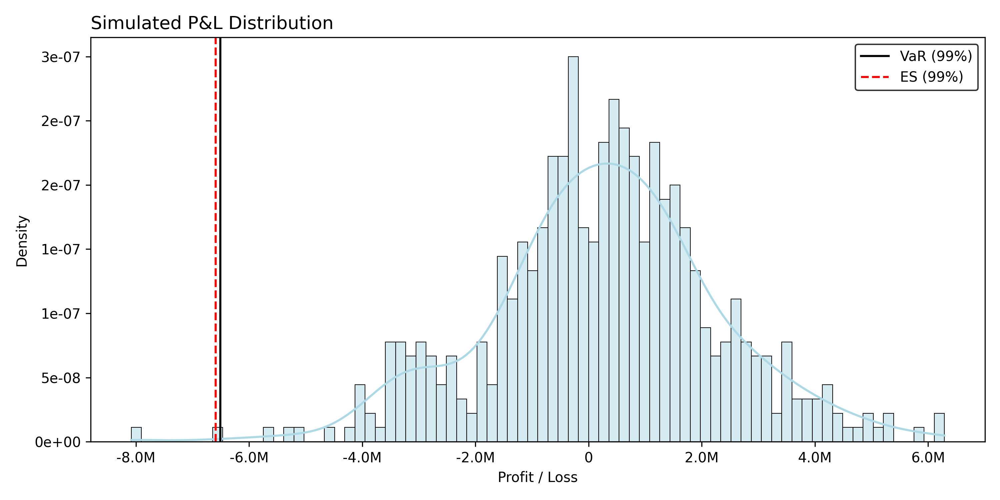

In [23]:
# Plot bootstrapped HS distribution
pv.plot_simulated_distribution(
    profit_and_loss=pnl_whs,
    var=var_whs,
    es=es_whs,
    confidence_level=confidence_level
)

---

### One-Day Ahead Filtered Historical Simulation (FHS)

**Filtered Historical Simulation** combines historical return information with time-varying volatility estimated from GARCH-type models. This method addresses the **volatility clustering** often observed in financial returns, which standard historical methods fail to capture.

The core procedure is:

1. Model conditional volatility of each asset using a GARCH process on past returns:
$$
r_t = \sigma_t \cdot z_t, \quad z_t \sim \text{i.i.d.}
$$
where $\sigma_t$ is the time-varying volatility, and $z_t$ are the standardized residuals.

2. Standardize historical returns to extract the residuals:
$$
z_t = \frac{r_t}{\sigma_t}
$$

3. Resample residuals **with or without replacement** to generate future innovations. 

4. Scale back using the latest forecasted volatility:
$$
\tilde{r}_{t+1} = \sigma_{T} \cdot z^*_{t}
$$
where $z^*_{t}$ is a resampled standardized residual, and $\sigma_T$ denotes the **most recent volatility forecast**.

5. Apply simulated returns to current prices, revalue the portfolio, and compute the P\&L distribution.

This approach improves standard historical VaR by incorporating time-varying risk. FHS is especially effective in stressed markets or periods of volatility change.

In [24]:
# Run Filtered Historical Simulation (1-day horizon, 99% confidence)
var_fhs, pnl_fhs = pv.filtered_historical_simulation_var(
    price_data=prices_usd,
    shares=shares.values,
    options=options,
    confidence_level=confidence_level,
    bootstrap=True,
    simulations=simulations,
    seed=seed,
    p=1,
    q=1,
    model="GJR",         # or "EGARCH", "GJR", "APARCH"
    distribution="skewt"  # or "t", "ged", "skewt"
)

# Calculate ES
es_fhs = pv.simulation_es(var_fhs, pnl_fhs)

In [25]:
# Display results
print(f"Filtered Historical Simulation VaR (99%):   {var_fhs:,.2f} USD")
print(f"Filtered Historical Simulation ES  (99%):   {es_fhs:,.2f} USD")

Filtered Historical Simulation VaR (99%):   7,158,684.58 USD
Filtered Historical Simulation ES  (99%):   8,041,860.23 USD



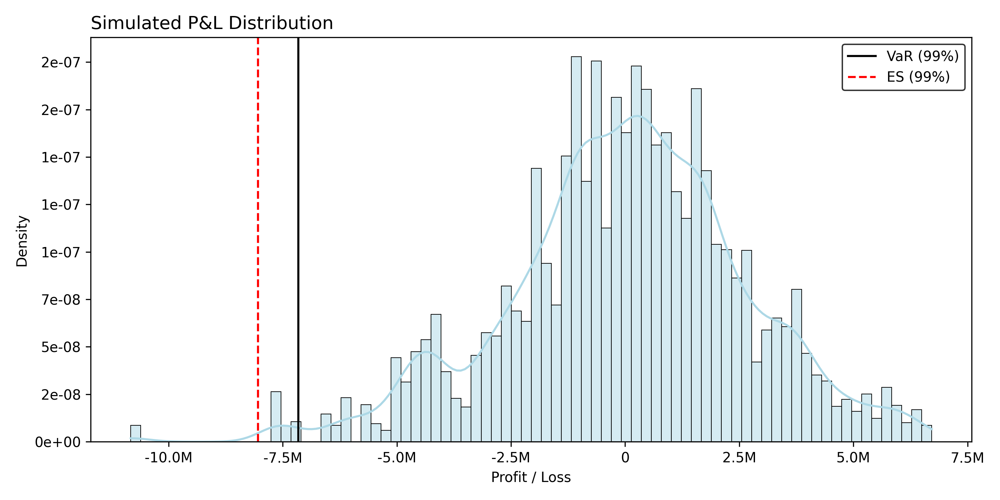

In [26]:
# Plot FHS distribution
pv.plot_simulated_distribution(
    profit_and_loss=pnl_fhs,
    var=var_fhs,
    es=es_fhs,
    confidence_level=0.99
)

#### Comparison of Simulation-Based VaR Methods

We compare the 1-day P&L distributions generated by the main simulation-based VaR methods, including:

- Monte Carlo (Normal)  
- GMM-based Monte Carlo  
- Bootstrap Simulation  
- Weighted Historical Simulation (WHS)  
- Filtered Historical Simulation (FHS) 

For each method, we visualize the **kernel density estimate (KDE)** of simulated losses and mark the corresponding VaR level at a 99% confidence.

It can be noted that **Monte Carlo** gives the **lowest VaR**, as it assumes a thin-tailed normal distribution, potentially underestimating the likelihood of extreme losses. The **GMM-based Monte Carlo** method yields a moderately higher VaR, as it **parametrically incorporates fat tails**, providing a better fit to empirical return distributions.

All **historical-based methods** result in **higher VaR estimates**, reflecting the non-parametric fat tails in observed data. In particular, the **Weighted Historical Simulation** and **Filtered Historical Simulation** methods produce the **highest VaR values**.

This is largely due to their greater sensitivity to recent market conditions: WHS assigns higher weights to more recent observations, while FHS explicitly models time-varying volatility. In this case, a recent spike in volatility in the final observation window leads to a sharply increased VaR; especially under FHS.

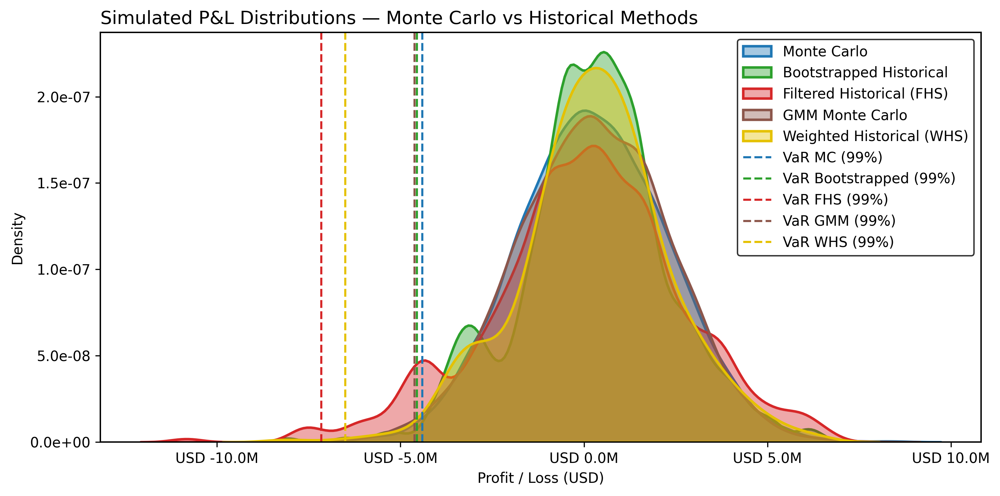

In [27]:
# Plot
plt.figure(figsize=(10, 5), dpi=300)

# KDE plots (filled, smooth)
sns.kdeplot(pnl_mc, label="Monte Carlo", fill=True, color="#1f77b4", linewidth=1.8, alpha=0.4)
sns.kdeplot(pnl_historical_bootstrap, label="Bootstrapped Historical", fill=True, color="#2ca02c", linewidth=1.8, alpha=0.4)
sns.kdeplot(pnl_fhs, label="Filtered Historical (FHS)", fill=True, color="#d62728", linewidth=1.8, alpha=0.4)
sns.kdeplot(pnl_gmm, label="GMM Monte Carlo", fill=True, color="#8c564b", linewidth=1.8, alpha=0.4)
sns.kdeplot(pnl_whs, label="Weighted Historical (WHS)", fill=True, color="#e5c100", linewidth=1.8, alpha=0.4)  

# VaR vertical lines
plt.axvline(-var_mc, color="#1f77b4", linestyle="--", linewidth=1.5, label="VaR MC (99%)")
plt.axvline(-var_historical_bootstrap, color="#2ca02c", linestyle="--", linewidth=1.5, label="VaR Bootstrapped (99%)")
plt.axvline(-var_fhs, color="#d62728", linestyle="--", linewidth=1.5, label="VaR FHS (99%)")
plt.axvline(-var_gmm, color="#8c564b", linestyle="--", linewidth=1.5, label="VaR GMM (99%)")
plt.axvline(-var_whs, color="#e5c100", linestyle="--", linewidth=1.5, label="VaR WHS (99%)")  

# Labels and title
plt.title("Simulated P&L Distributions — Monte Carlo vs Historical Methods", fontsize=13, loc="left", fontweight="medium")
plt.xlabel("Profit / Loss (USD)")
plt.ylabel("Density")

# Axes styling
ax = plt.gca()
for side in ["top", "bottom", "left", "right"]:
    ax.spines[side].set_visible(True)
    ax.spines[side].set_color("black")
    ax.spines[side].set_linewidth(1)

ax.tick_params(width=0.8, color='black')

# Format x-axis in Millions
ax.xaxis.set_major_formatter(FuncFormatter(lambda x, _: f"USD {x/1_000_000:.1f}M"))

# Scientific notation for density
ax.yaxis.set_major_formatter(FuncFormatter(lambda y, _: f"{y:.1e}"))

# Legend
plt.legend(frameon=True, edgecolor="black")
plt.tight_layout()
plt.show()

In [28]:
# Create a dictionary of method names and their corresponding VaR values
var_summary = {
    "Monte Carlo (MC)": var_mc,
    "Bootstrapped Historical": var_historical_bootstrap,
    "Filtered Historical Simulation (FHS)": var_fhs,
    "Weighted Historical Simulation (WHS)": var_whs,
    "GMM Monte Carlo": var_gmm
}

# Print summary
print("Summary of 1-Day VaR Estimates (99% Confidence Level):\n")
for method, var in var_summary.items():
    print(f"{method:<40s}: USD {var:,.2f}")

Summary of 1-Day VaR Estimates (99% Confidence Level):

Monte Carlo (MC)                        : USD 4,407,931.13
Bootstrapped Historical                 : USD 4,556,184.04
Filtered Historical Simulation (FHS)    : USD 7,158,684.58
Weighted Historical Simulation (WHS)    : USD 6,508,074.85
GMM Monte Carlo                         : USD 4,618,421.87


---

### Multiday Extensions

We now explore the **multiday version** of simulation-based VaR for the **equity-only** portfolio. The focus is on projecting risk over a **3-months horizon** (~66 trading days) using two approaches:

- **Multiday Monte Carlo**: simulates paths using correlated normal returns.
- **Multiday GMM Simulation**: uses a fitted Gaussian Mixture Model to better capture fat tails and skewness.

These methods allow us to model compounding risk over longer periods while retaining flexibility in return dynamics.

In [29]:
# Forecast lenght
days_ahead = 66

In [30]:
# Run the simulation
var_mc_multiday, pnl_mc_multiday, portfolio_paths_mc_multiday = pv.multiday_monte_carlo_simulation_var(
    price_data=prices_usd,
    shares=shares, 
    confidence_level=confidence_level,
    days_ahead=days_ahead,
    simulations=simulations,
    seed=seed
)

# ES
es_mc_multiday = pv.simulation_es(var_mc_multiday, pnl_mc_multiday)

# Print results
print(f"Monte Carlo multi-day VaR (99%):  {var_mc_multiday:,.2f} USD")
print(f"Monte Carlo multi-day ES  (99%):  {es_mc_multiday:,.2f} USD")

Monte Carlo multi-day VaR (99%):  9,274.38 USD
Monte Carlo multi-day ES  (99%):  11,520.74 USD



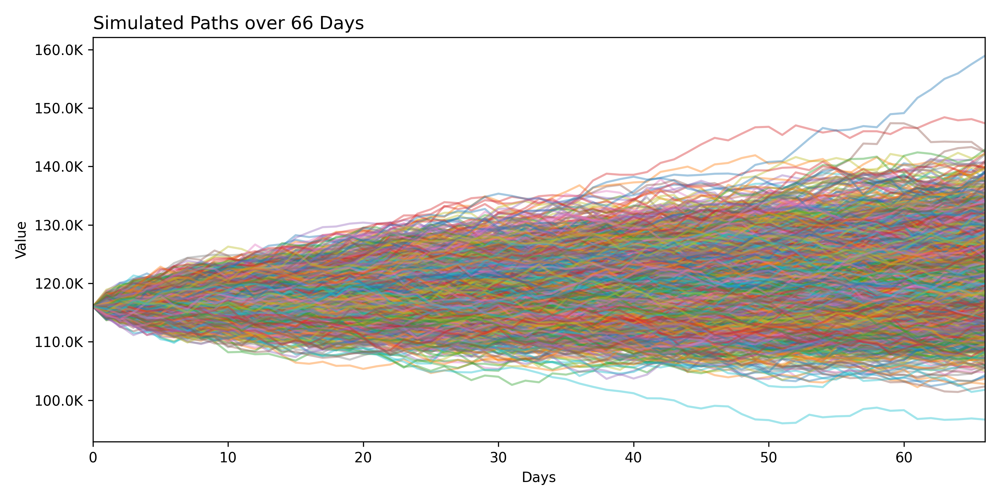

In [31]:
# Plot paths over time
pv.plot_simulated_paths(portfolio_paths_mc_multiday)

In [32]:
# Run GMM-based multiday Monte Carlo simulation
var_gmm_multiday, pnl_gmm_multiday, portfolio_paths_multiday_gmm = pv.multiday_gmm_monte_carlo_simulation_var(
    price_data=prices_usd,
    shares=shares, 
    confidence_level=confidence_level,
    days_ahead=days_ahead,
    simulations=simulations,
    seed=seed,
    n_components=n_components   
)

# Compute Expected Shortfall
es_gmm_multiday = pv.simulation_es(var_gmm_multiday, pnl_gmm_multiday)

# Print results
print(f"GMM Monte Carlo 66-day VaR (99%):  {var_gmm_multiday:,.2f} USD")
print(f"GMM Monte Carlo 66-day ES  (99%):  {es_gmm_multiday:,.2f} USD")

GMM Monte Carlo 66-day VaR (99%):  9,793.32 USD
GMM Monte Carlo 66-day ES  (99%):  11,386.21 USD



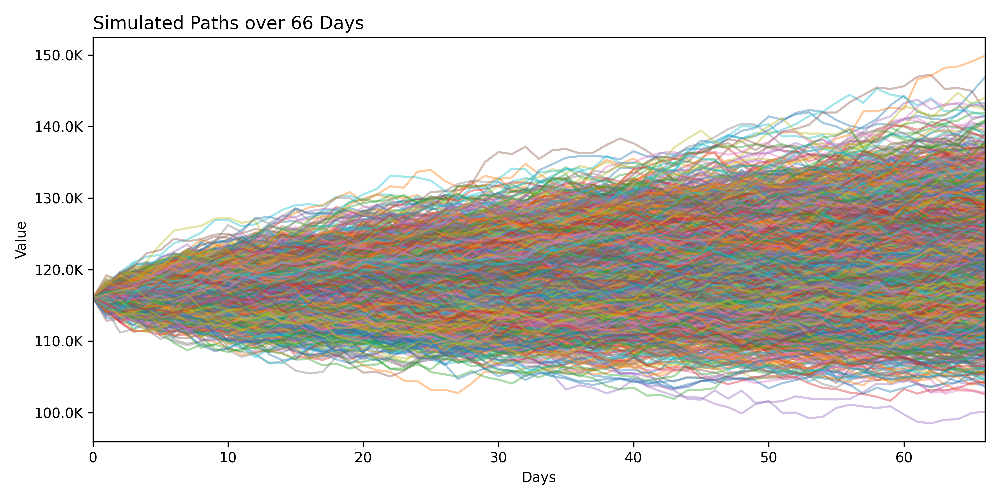

In [33]:
# Plot paths over time
pv.plot_simulated_paths(portfolio_paths_multiday_gmm)

#### Comparing Multiday GMM and Monte Carlo

We compare the simulated profit-and-loss distributions from the **GMM-based** and **standard Monte Carlo** approaches over a **66-day ahead forecast**. The GMM distribution shows **slightly fatter tails**, leading to marginally higher VaR estimates, though the overall difference is small.

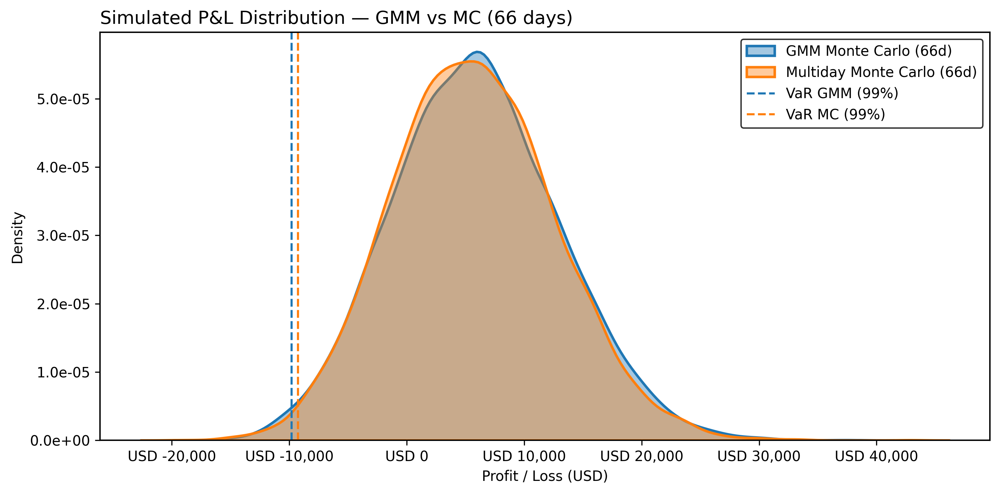

In [34]:
# Create the plot
plt.figure(figsize=(10, 5), dpi=300)

# KDE plots
sns.kdeplot(pnl_gmm_multiday, label="GMM Monte Carlo (66d)", fill=True, color="#1f77b4", linewidth=1.8, alpha=0.4)
sns.kdeplot(pnl_mc_multiday, label="Multiday Monte Carlo (66d)", fill=True, color="#ff7f0e", linewidth=1.8, alpha=0.4)

# VaR lines
plt.axvline(-var_gmm_multiday, color="#1f77b4", linestyle="--", linewidth=1.5, label="VaR GMM (99%)")
plt.axvline(-var_mc_multiday, color="#ff7f0e", linestyle="--", linewidth=1.5, label="VaR MC (99%)")

# Title and labels
plt.title("Simulated P&L Distribution — GMM vs MC (66 days)", loc="left", fontsize=13, fontweight="medium")
plt.xlabel("Profit / Loss (USD)")
plt.ylabel("Density")

# Axis styling
ax = plt.gca()
for side in ["top", "bottom", "left", "right"]:
    ax.spines[side].set_visible(True)
    ax.spines[side].set_color("black")
    ax.spines[side].set_linewidth(1)

ax.tick_params(width=0.8, color='black')

# Format x-axis as currency
ax.xaxis.set_major_formatter(FuncFormatter(lambda x, _: f"USD {x:,.0f}"))
ax.yaxis.set_major_formatter(FuncFormatter(lambda y, _: f"{y:.1e}"))

# Legend
plt.legend(frameon=True, edgecolor="black")
plt.tight_layout()
plt.show()